In [83]:
# importing packages
import numpy as np
import pandas as pd
import dateutil
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd
import spacy
import re
import descartes
from matplotlib import cm
import colorsys
from matplotlib import colors
from matplotlib import cm
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [80]:
# Praparing the the dictionary

# Writing Spacy Lemmatizer for lists function
def spacy_list_lemmatizer(text, nlp):
    nlp.disable_pipes('tagger', 'ner')
    doclist = list(nlp.pipe(text, n_threads=3,  batch_size=50))
    docs=[]
    for i, doc in enumerate(doclist):
        docs.append(' '.join([listitem.lemma_ for listitem in doc]))
    return docs


# creating the lemmas of all english co-searchterms
searchterms_eng = ["'agile' capability", "'agile' ceremony", "'agile' certificate", "'agile' certification", "'agile' coach", "'agile' coaching", "'agile' delivery", "'agile' development", "'agile' digital capability ", "'agile' environment", "'agile' innovation", "'agile' management", "'agile' manifesto", "'agile' method", "'agile' methodology", "'agile' mindset", "'agile' operating model", "'agile' organisation", "'agile' organization unit", "'agile' principles", "'agile' processes", "'agile' programming", "'agile' project", "'agile' project management", "'agile' software development", "'agile' stages", "'agile' structures", "'agile' team", "'agile' techniques", "'agile' transformation", "'agile' transition", "'agile' Value", "'agile' walls", "'agile' way", "'agile' way of working", "'agile' work", "'agile' work practices", "'agile' working and management methods", "'agile' working culture", "'agile' working methods", "agile capability", "agile ceremony", "agile certificate", "agile certification", "agile coach", "agile coaching", "agile delivery", "agile development", "agile digital capability ", "agile environment", "agile innovation", "agile management", "agile manifesto", "agile method", "agile methodology", "agile mindset", "agile operating model", "agile organisation", "agile organization unit", "agile principles", "agile processes", "agile programming", "agile project", "agile project management", "agile software development", "agile stages", "agile structures", "agile team", "agile techniques", "agile transformation", "agile transition", "agile Value", "agile walls", "agile way", "agile way of working", "agile work", "agile work practices", "agile working and management methods", "agile working culture", "agile working methods", "'agile' capability", "'agile' ceremony", "'agile' certificate", "'agile' certification", "'agile' coach", "'agile' coaching", "'agile' delivery", "'agile' development", "'agile' digital capability ", "'agile' environment", "'agile' innovation", "'agile' management", "'agile' manifesto", "'agile' method", "'agile' methodology", "'agile' mindset", "'agile' operating model", "'agile' organisation", "'agile' organization unit", "'agile' principles", "'agile' processes", "'agile' programming", "'agile' project", "'agile' project management", "'agile' software development", "'agile' stages", "'agile' structures", "'agile' team", "'agile' techniques", "'agile' transformation", "'agile' transition", "'agile' Value", "'agile' walls", "'agile' way", "'agile' way of working", "'agile' work", "'agile' work practices", "'agile' working and management methods", "'agile' working culture", "'agile' working methods", "backlog", "co-design", "collaboration spaces", "collaborative design", "cross-departmental approach", "daily scrum", "definition of done", "definition of ready", "design thinking", "development team", "empathy map", "extreme user", "fail fast", "fail forward", "free of hierarchy", "hierarchy free space", "innovation culture", "innovation management", "iteration", "iterative", "Kanban", "kanban board", "lean software development", "lean start up", "lean start-up", "lean startup", "minimum viable product", "MVP", "new team and management structures", "new work", "new working methods", "new working models", "planning poker", "product backlog", "product owner", "project canvas", "project work", "project-based", "scrum", "scrum coach", "scrum master", "scrum team", "service design", "short-cycle results", "software development", "sprint", "sprint backlog", "sprint planning", "sprint retrospective", "sprint review", "time box", "timeboxing", "user needs", "user requirements", "user research", "user story", "user testing", "user-centred", "user-centred design", "user-friendly solutions", "user-oriented", "visual thinking", "whiteboard", "wicked problem", "wireframe"]

nlp_eng = spacy.load("en_core_web_sm")

searchterms_eng_lemma = spacy_list_lemmatizer(searchterms_eng, nlp_eng)

searchterms_eng_lemma = [each_string.lower() for each_string in searchterms_eng_lemma]

# creating the lemmas of all german co-searchterms
searchterms_de = ["abteilungsübergreifender Ansatz", "agil arbeitende Organisationseinheit", "agil arbeitende Teams", "agile Arbeitsformen", "agile Arbeitskultur", "agile Arbeitsmethoden", "agile Arbeitspraktiken", "agile Arbeitsumgebung", "agile Arbeitsweise", "agile Bereitstellung", "agile digitale Fähigkeit ", "agile Entwicklung", "agile Fähigkeiten ", "agile Innovation", "agile Methode", "agile Methodik", "agile Organisation", "agile Phasen", "agile Prinzipien", "agile Prozesse", "agile Softwareentwicklung", "agile Softwareweiterentwicklung", "agile Strukturen", "agile Techniken", "agile Transformation", "Agile Transition", "agile Wände", "agile Weise", "agile Zeremonie", "agile Zertifizierung", "agilen Arbeits- und Managementmethoden", "agiler Ansatz", "agiler Coach", "agiler Wert", "agiles Arbeiten", "agiles Betriebsmodell", "agiles Coaching", "agiles Management", "Agiles Manifest", "agiles Mindset", "agiles Programmieren", "agiles Projekt", "Agiles Projektmanagement", "agiles Team", "agiles Training ", "agiles Zertifikat", '"agil" arbeitende Organisationseinheit', '"agil" arbeitende Teams', '"agile" Arbeitsformen', '"agile" Arbeitskultur', '"agile" Arbeitsmethoden', '"agile" Arbeitspraktiken', '"agile" Arbeitsumgebung', '"agile" Arbeitsweise', '"agile" Bereitstellung', '"agile" digitale Fähigkeit ', '"agile" Entwicklung', '"agile" Fähigkeiten ', '"agile" Innovation', '"agile" Methode', '"agile" Methodik', '"agile" Organisation', '"agile" Phasen', '"agile" Prinzipien', '"agile" Prozesse', '"agile" Softwareentwicklung', '"agile" Softwareweiterentwicklung', '"agile" Strukturen', '"agile" Techniken', '"agile" Transformation', '"agile" Transition', '"agile" Wände', '"agile" Weise', '"agile" Zeremonie', '"agile" Zertifizierung', '"agilen" Arbeits- und Managementmethoden', '"agiler" Ansatz', '"agiler" Coach', '"agiler" Wert', '"agiles" Arbeiten', '"agiles" Betriebsmodell', '"agiles" Coaching', '"agiles" Management', '"agiles" Manifest', '"agiles" Mindset', '"agiles" Programmieren', '"agiles" Projekt', '"agiles" Projektmanagement', '"agiles" Team', '"agiles" Training ', '"agiles" Zertifikat', "'agil' arbeitende Organisationseinheit", "'agil' arbeitende Teams", "'agile' Arbeitsformen", "'agile' Arbeitskultur", "'agile' Arbeitsmethoden", "'agile' Arbeitspraktiken", "'agile' Arbeitsumgebung", "'agile' Arbeitsweise", "'agile' Bereitstellung", "'agile' digitale Fähigkeit ", "'agile' Entwicklung", "'agile' Fähigkeiten ", "'agile' Innovation", "'agile' Methode", "'agile' Methodik", "'agile' Organisation", "'agile' Phasen", "'agile' Prinzipien", "'agile' Prozesse", "'agile' Softwareentwicklung", "'agile' Softwareweiterentwicklung", "'agile' Strukturen", "'agile' Techniken", "'agile' Transformation", "'agile' Transition", "'agile' Wände", "'agile' Weise", "'agile' Zeremonie", "'agile' Zertifizierung", "'agilen' Arbeits- und Managementmethoden", "'agiler' Ansatz", "'agiler' Coach", "'agiler' Wert", "'agiles' Arbeiten", "'agiles' Betriebsmodell", "'agiles' Coaching", "'agiles' Management", "'agiles' Manifest", "'agiles' Mindset", "'agiles' Programmieren", "'agiles' Projekt", "'agiles' Projektmanagement", "'agiles' Team", "'agiles' Training ", "'agiles' Zertifikat", "Backlog", "Co-Design", "Daily Scrum", "Definition of Done", "Definition of Ready", "Design Thinking", "Empathy Map", "Entwicklungsteam", "Extremnutzer Nutzer", "fail fast", "fail forward", "hierarchiefrei", "hierarchiefreien Raum", "Innovationskultur", "Innovationsmanagement", "Iteration", "iterativ ", "Kanban", "Kanbanboard", "Kollaborationsräume", "kollaboratives Design", "kurzzyklische Ergebnisse", "Lean Start up", "Lean Start-up", "Lean Startup",  "Minimum Viable Product", "MVP", "neue Arbeitsmodelle", "neue Arbeitsweisen", "neue Team- und Führungsstrukturen", "New Work", "Nutzeranforderungen", "Nutzerbedürfnisse", "Nutzerforschung", "nutzerorientiert", "nutzerorientierte Lösungen", "Nutzerstory", "Nutzertest", "nutzerzentriert", "nutzerzentriertes Design", "Planning Poker", "Product Backlog", "Product Owner", "Project Canvas", "Projektarbeiten", "Projektbasiert", "schlanke Softwareentwicklung", "Scrum", "Scrum Coach", "Scrum Master", "Scrum Team", "Service Design", "Softwareentwicklung", "Sprint", "Sprint Backlog", "Sprint Planning", "Sprint Retrospective", "Sprint Review", "Timebox", "Timeboxing", "visuelles Denken", "Whiteboard", "Wicked Problem", "Wireframe"]

nlp_de = spacy.load("de_core_news_sm")

searchterms_de_lemma = spacy_list_lemmatizer(searchterms_de, nlp_de)

searchterms_de_lemma = [each_string.lower() for each_string in searchterms_de_lemma]

# merging both lists for germany and deleting duplicates

in_english_list = set(searchterms_eng_lemma)
in_german_list  = set(searchterms_de_lemma)

in_german_but_not_in_english_list = in_german_list - in_english_list

searchterms_de_eng_lemma = searchterms_eng_lemma + list(in_german_but_not_in_english_list)

# removing the english lemma of design thinking which is design think
searchterms_de_eng_lemma.remove("design think")


{"' agile ' capability": 0, "' agile ' ceremony": 0, "' agile ' certificate": 0, "' agile ' certification": 0, "' agile ' coach": 0, "' agile ' delivery": 0, "' agile ' development": 0, "' agile ' digital capability": 0, "' agile ' environment": 0, "' agile ' innovation": 0, "' agile ' management": 0, "' agile ' manifesto": 0, "' agile ' method": 0, "' agile ' methodology": 0, "' agile ' mindset": 0, "' agile ' operate model": 0, "' agile ' organisation": 0, "' agile ' organization unit": 0, "' agile ' principle": 0, "' agile ' process": 0, "' agile ' programme": 0, "' agile ' project": 0, "' agile ' project management": 0, "' agile ' software development": 0, "' agile ' stage": 0, "' agile ' structure": 0, "' agile ' team": 0, "' agile ' technique": 0, "' agile ' transformation": 0, "' agile ' transition": 0, "' agile ' value": 0, "' agile ' wall": 0, "' agile ' way": 0, "' agile ' way of work": 0, "' agile ' work": 0, "' agile ' work practice": 0, "' agile ' work and management metho

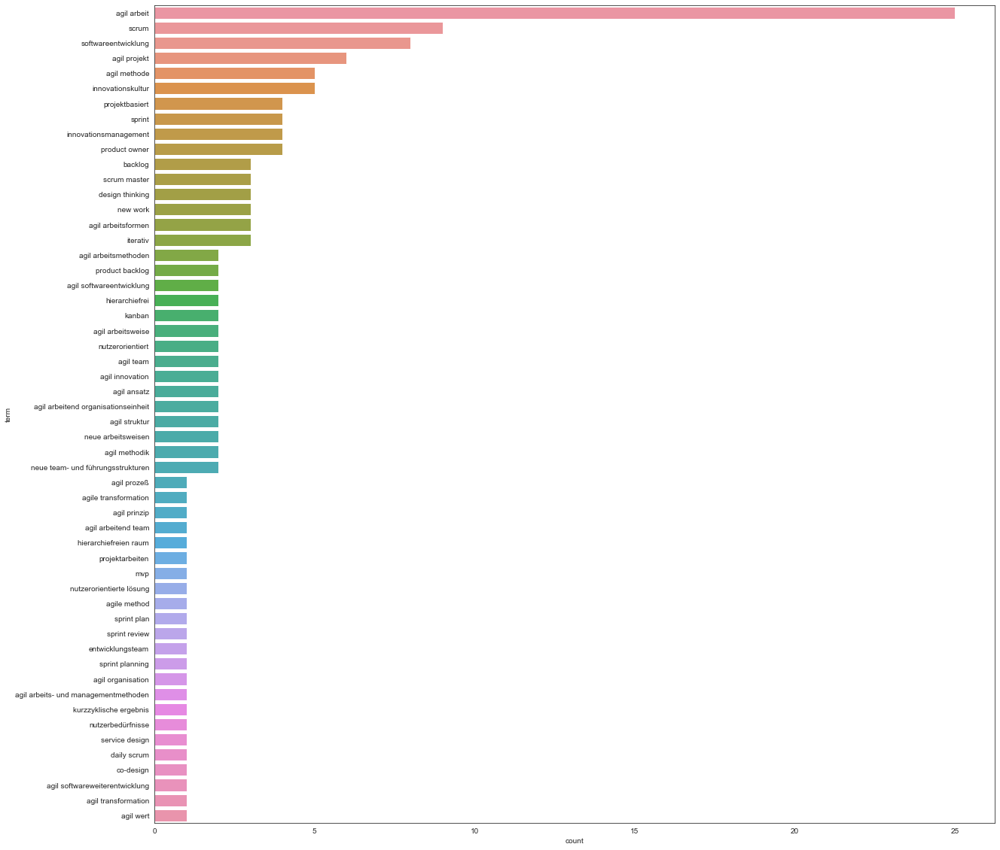

In [130]:
# plotting the co_occurence term frequency for Germany

df = pd.read_csv("/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/2_Data_Preprocessing/DATA/CSVs/Germany/Combined_cleaned.csv")

dict_count = {}

for term in searchterms_de_eng_lemma:
    dict_count[term.lower()] = len(df[df['co_searchterms_matches'].str.contains(term.lower(), flags = re.IGNORECASE)])
print(dict_count)

df_count = pd.DataFrame(dict_count.items(), columns = ["term", "count"])
df_count.sort_values(by="count", inplace=True, ascending=False)
df_count = df_count[df_count['count'] != 0]
plt.figure(figsize=(20,20))
sns.barplot(data=df_count, x="count", y="term", orient="h")


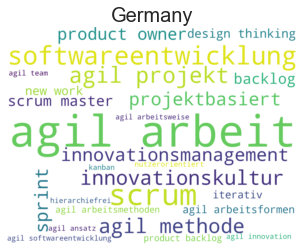

<Figure size 936x1080 with 0 Axes>

In [131]:
# Plotting wordcloud for Britain

d = {}
for a, x in df_count.values:
    d[a] = x

import matplotlib.pyplot as plt
from wordcloud import WordCloud

wordcloud = WordCloud(width=2000, height=1500, max_font_size=300, min_font_size=50, max_words=60, background_color="white", colormap="viridis")
wordcloud.generate_from_frequencies(frequencies=d)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.title('Germany', fontsize=20)
plt.axis("off")
plt.figure(figsize=(2^15,2^13))
plt.show()
wordcloud.to_file("wordcloud_germany.png")

In [106]:
# plotting the co_occurence term frequency for the UK

df = pd.read_csv('/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/2_Data_Preprocessing/DATA/CSVs/UK/General_cleaned_org.csv')

dict_count = {}

for term in searchterms_eng_lemma:
    dict_count[term.lower()] = len(df[df['co_searchterms_matches'].str.contains(term.lower(), flags = re.IGNORECASE)])
print(dict_count)

df_count = pd.DataFrame(dict_count.items(), columns = ["term", "count"])
df_count.sort_values(by="count", inplace=True, ascending=False)
df_count = df_count[df_count['count'] != 0]


{"' agile ' capability": 0, "' agile ' ceremony": 0, "' agile ' certificate": 0, "' agile ' certification": 0, "' agile ' coach": 0, "' agile ' delivery": 0, "' agile ' development": 0, "' agile ' digital capability": 0, "' agile ' environment": 0, "' agile ' innovation": 0, "' agile ' management": 0, "' agile ' manifesto": 0, "' agile ' method": 0, "' agile ' methodology": 0, "' agile ' mindset": 0, "' agile ' operate model": 0, "' agile ' organisation": 0, "' agile ' organization unit": 0, "' agile ' principle": 0, "' agile ' process": 0, "' agile ' programme": 0, "' agile ' project": 0, "' agile ' project management": 0, "' agile ' software development": 0, "' agile ' stage": 0, "' agile ' structure": 0, "' agile ' team": 0, "' agile ' technique": 0, "' agile ' transformation": 0, "' agile ' transition": 0, "' agile ' value": 0, "' agile ' wall": 0, "' agile ' way": 0, "' agile ' way of work": 0, "' agile ' work": 0, "' agile ' work practice": 0, "' agile ' work and management metho

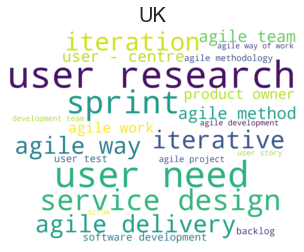

<Figure size 936x1080 with 0 Axes>

In [128]:
# Plotting wordcloud for Britain

d = {}
for a, x in df_count.values:
    d[a] = x

import matplotlib.pyplot as plt
from wordcloud import WordCloud

wordcloud = WordCloud(width=2000, height=1500, max_font_size=300, min_font_size=50, max_words=60, background_color="white", colormap="viridis")
wordcloud.generate_from_frequencies(frequencies=d)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.title('UK', fontsize=20)
plt.axis("off")
plt.figure(figsize=(2^15,2^13))
plt.show()
wordcloud.to_file("wordcloud_uk.png")

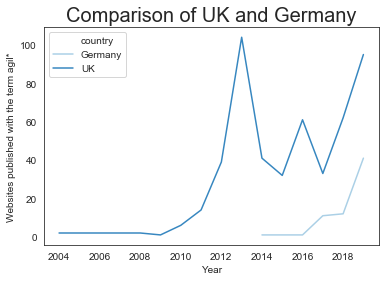

In [104]:
###### Comparing UK and Germany
inputFileName = "/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/2_Data_Preprocessing/DATA/CSVs/Master_File.csv"
df=pd.read_csv(inputFileName, parse_dates=["final_date"])
df['Year'] = df['final_date'].dt.year
df["Websites published with the term agil*"] = 1
df2 = df.groupby(['country', "Year"]).count()

df2.reset_index(inplace=True)
sns.set_style("white")
sns.set_palette('Blues', 2) 
plt = sns.lineplot(x='Year', y="Websites published with the term agil*", data=df2, hue='country').set_title("Comparison of UK and Germany",  fontsize=20)

fig.savefig('germany_vs_uk.png', dpi=900, bbox_inches = 'tight',
    pad_inches = 0 )

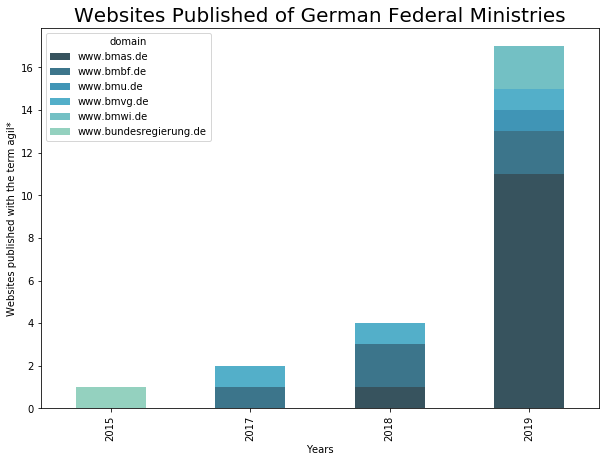

In [97]:
###### Comparing different Ministries in Germany
inputFileName = "/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/2_Data_Preprocessing/DATA/CSVs/Master_File.csv"
df=pd.read_csv(inputFileName, parse_dates=["final_date"])
df['Year'] = df['final_date'].dt.year
df = df[df['level'] == 'Federal']
df["Websites published with the term agil*"] = 1
df = df[['domain', 'Year', "Websites published with the term agil*"]]

year_list = ['2015', '2016', '2017', '2018']

domain_list = ["www.bmvg.de", "www.bmbf.de", "www.bmas.de", "www.bmu.de", "www.bmwi.de", "www.bundesregierung.de"]

# for domain in domain_list:
#     df_sub = df[df['domain']==domain]
#     #print(domain)
#     for year in year_list:
#         #print(year)
#         if year not in df_sub['Year']:
#             print(year)
#             row_df = pd.DataFrame({'domain':[domain], 
#                                     'Year': [year],
#                                     "Websites published with the term agil*": [0]})
#             df = df.append(row_df)


df2 = df.groupby(['domain', "Year"]).count()
df2.reset_index(inplace=True)



pivot_df = df2.pivot(index='Year', columns="domain", values="Websites published with the term agil*")
pivot_df.fillna(0, inplace=True)
pivot_df.append(pd.DataFrame([(0,0,0,0,0)], index=["2016"]))

colors = sns.color_palette("GnBu_d", 6).as_hex()
pivot_df.plot.bar(stacked=True, color=colors, figsize=(10,7))
plt.title('Websites Published of German Federal Ministries', fontsize=20)
plt.xlabel('Years')
plt.ylabel('Websites published with the term agil*')
plt.savefig('germany_ministries.png', dpi=900, bbox_inches = 'tight',
    pad_inches = 0 )

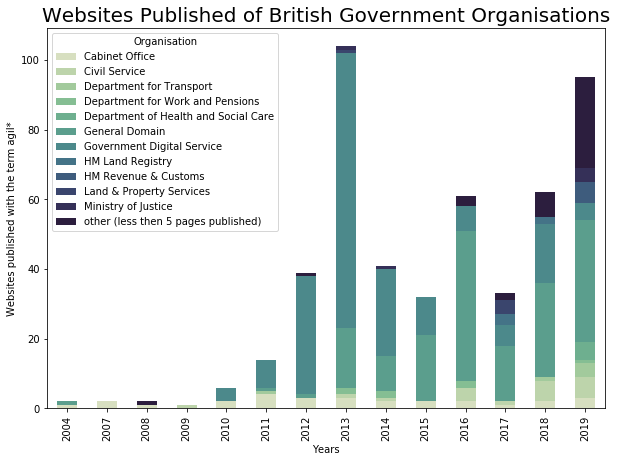

In [98]:
###### Comparing different Ministries in the uK
inputFileName = "/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/2_Data_Preprocessing/DATA/CSVs/Master_File.csv"
df=pd.read_csv(inputFileName, parse_dates=["final_date"])
df['Year'] = df['final_date'].dt.year
df = df[df['level'] == 'General']
df["Websites published with the term agil*"] = 1
df = df[['Organisation', 'Year', "Websites published with the term agil*"]]


df2 = df.groupby(['Organisation', "Year"]).count()
df2.reset_index(inplace=True)

# everything with less then a certain number of pages will fall under "other"
total_number = 5

other = "".join(["other (less then ", str(total_number), " pages published)"])
for organisation in df2['Organisation']:
    df_sub = df2[df2['Organisation'] == organisation]
    if df_sub['Websites published with the term agil*'].sum() < total_number:
        df2["Organisation"].replace({organisation : other}, inplace=True)

df2 = df2.groupby(['Organisation', "Year"]).sum()
df2.reset_index(inplace=True)

pivot_df = df2.pivot(index='Year', columns="Organisation", values="Websites published with the term agil*")
pivot_df.fillna(0, inplace=True)
#pivot_df = pivot_df[pivot_df.columns[pivot_df.sum()>2]]

#sns.color_palette("Blues")
colors = sns.cubehelix_palette(12, start=.5, rot=-.75).as_hex()
pivot_df.plot.bar(stacked=True, color=colors, figsize=(10,7))
plt.title('Websites Published of British Government Organisations', fontsize=20)
plt.xlabel('Years')
plt.ylabel('Websites published with the term agil*')
plt.savefig('british_organisations.png', dpi=900, bbox_inches = 'tight',
    pad_inches = 0 )

In [101]:
# calculating individual German statate's "agile readiness index"

state_list = ["Schleswig-Holstein", "Bremen", "Hamburg", "Lower Saxony", "Thuringia", "Saxony-Anhalt", "Saxony", "Mecklenburg-Vorpommern", "Berlin", "Brandenburg", "North Rhine-Westphalia", "Rhineland-Palatinate", "Saarland", "Hesse", "Bavaria", "Baden-Wuerttemberg"]

df = pd.read_csv("/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/2_Data_Preprocessing/DATA/CSVs/Germany/Combined_cleaned.csv")

df = df[df.level != "Federal"]

state_list = ["Schleswig-Holstein", "Bremen", "Hamburg", "Lower Saxony", "Thuringia", "Saxony-Anhalt", "Saxony", "Mecklenburg-Vorpommern", "Berlin", "Brandenburg", "North Rhine-Westphalia", "Rhineland-Palatinate", "Saarland", "Hesse", "Bavaria", "Baden-Wuerttemberg"]

df_counts = df.groupby(["level"]).count()
df_counts = df_counts[["id"]]
df_counts = df_counts.rename(columns={"id":"total_count"})
for state in state_list:
    if state not in df_counts.index:
        row_df = pd.DataFrame([[0]], index = [state], columns=['total_count'])
        df_counts = pd.concat([row_df, df_counts])
df_counts['agile_breadth'] = (df_counts['total_count']/df_counts['total_count'].max())*100


df_co_terms = df.groupby(['level']).sum()
df_co_terms = df_co_terms[["co_searchterms_nr"]]
df_co_terms = df_co_terms.rename(columns={"co_searchterms_nr":"total_co_searchterms_nr"})
for state in state_list:
    if state not in df_co_terms.index:
        row_df = pd.DataFrame([[0]], index = [state], columns=['total_co_searchterms_nr'])
        df_co_terms = pd.concat([row_df, df_co_terms])
df3 = pd.concat([df_counts, df_co_terms], axis=1)



df3['agile_depth_absolute'] = df3['total_co_searchterms_nr'] / df3['total_count']

df3['agile_depth'] = (df3['agile_depth_absolute'] / df3['agile_depth_absolute'].max())*100


df3['agile_readiness_index_absolute'] = df3['agile_depth'] + df3['agile_breadth']

df3['agile_readiness_index'] = (df3['agile_readiness_index_absolute'] / df3['agile_readiness_index_absolute'].max()) * 100

df3['agile_readiness_index'].fillna(0, inplace=True)

df3 = df3.rename(index={'Baden-Wuerttemberg': 'Baden-Württemberg'})

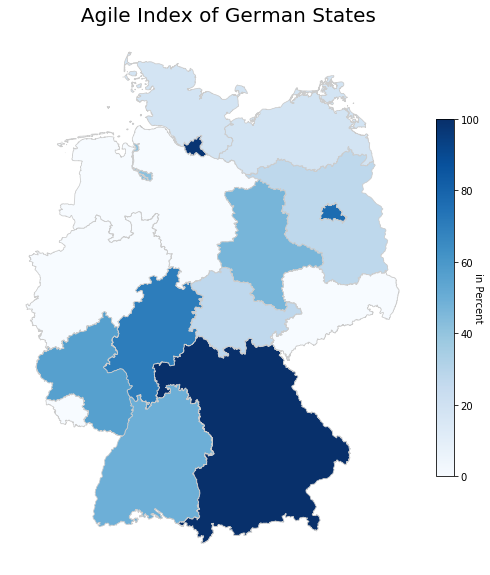

In [102]:
# plotting Germany Federal levels on map

# set the filepath and load in a shapefile
fp = "/Users/mxm/Google Drive/Masterstudium/Inhalte/Master Thesis/GitHubRepo/agile-in-government/Analysis/3_Data_Analysis/Igismap/Germany_Polygon.shp"
map_df = gpd.read_file(fp)
# check data type so we can see that this is not a normal dataframe, but a GEOdataframe

merged = map_df.set_index('name').join(df3)

# set a variable that will call whatever column we want to visualise on the map
variable = "agile_readiness_index"
# set the range for the choropleth
vmin, vmax = 0,100
# create figure and axes for Matplotlib
figlength = 5
fig, ax = plt.subplots(1, figsize=(8,20))
# create map
merged.plot(column=variable, cmap="Blues", linewidth=0.8, ax=ax, edgecolor='0.8')
ax.set_aspect(aspect=1.55)
ax.axis("off")
# add a title
ax.set_title('     Agile Index of German States', fontdict={'fontsize': '20', 'fontweight' : '3'})
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# empty array for the data range
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm, fraction=0.04, pad=0.04)
cbar.set_label('in Percent', rotation=270)
# saving the figure
fig.savefig('map_export.png', dpi=900, bbox_inches = 'tight',
    pad_inches = 0 )
